In [8]:
pip install opencv-python numpy pillow tqdm matplotlib pyyaml


     ---------------------------------------- 2.6/2.6 MB 12.8 MB/s eta 0:00:00
     ---------------------------------------- 78.5/78.5 KB ? eta 0:00:00
     ---------------------------------------- 7.8/7.8 MB 16.7 MB/s eta 0:00:00
     -------------------------------------- 162.3/162.3 KB 9.5 MB/s eta 0:00:00
     ---------------------------------------- 55.8/55.8 KB 2.9 MB/s eta 0:00:00
     -------------------------------------- 211.8/211.8 KB 6.5 MB/s eta 0:00:00
  Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
     ---------------------------------------- 2.2/2.2 MB 9.4 MB/s eta 0:00:00
  Using cached pyparsing-3.2.1-py3-none-any.whl (107 kB)
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\hp\AppData\Local\Programs\Python\Python39\python.exe -m pip install --upgrade pip' command.


In [9]:
import os
import random
import cv2
import numpy as np
from PIL import Image
from tqdm import tqdm 
import random
import matplotlib.pyplot as plt

import yaml

import shutil

In [10]:
datapath = r"F:\Machine-Learning\tiger_pose\dataset"

### EDA:

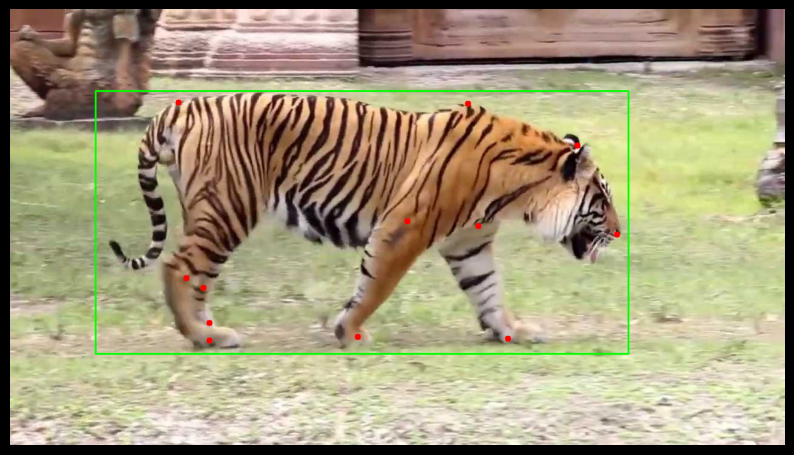

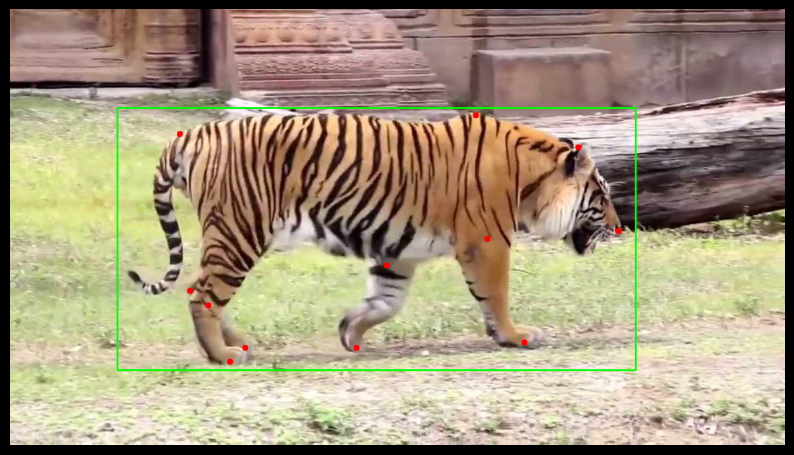

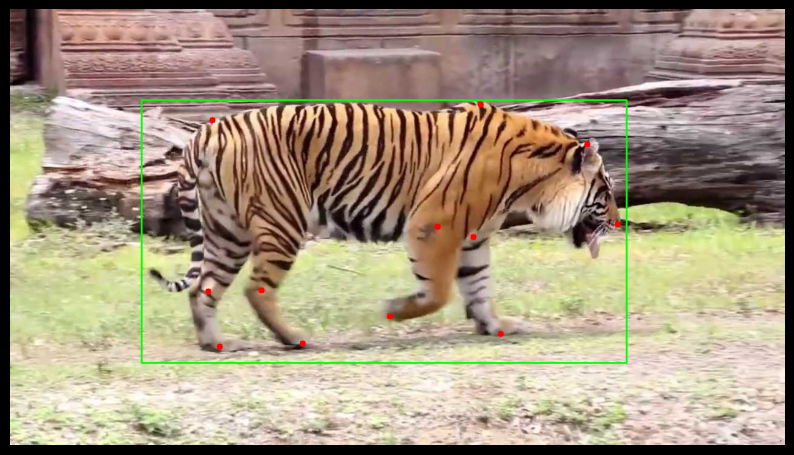

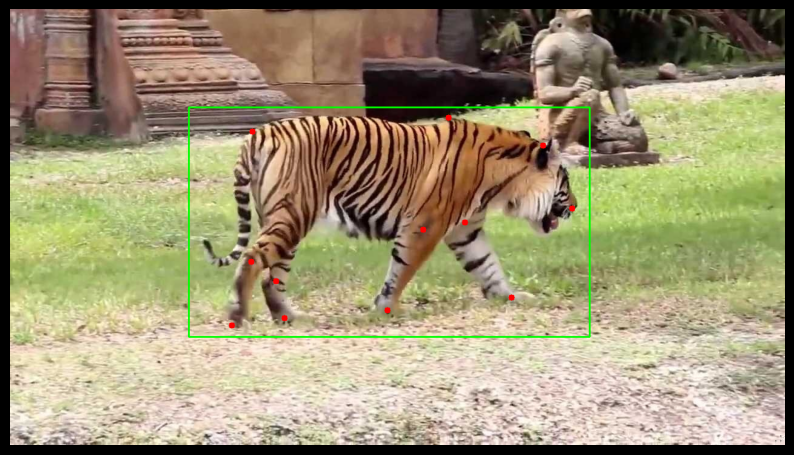

In [11]:
data_folder = datapath

# Function to parse YOLO pose format annotation
def parse_yolo_pose(annotation_path):
    with open(annotation_path, 'r') as file:
        line = file.readline().strip().split()
        data = list(map(float, line[1:]))  # Skip class index
        bbox = data[:4]  # Bounding box format: [x, y, width, height]
        keypoints = data[4:]  # Keypoints format: [px1, py1, px2, py2, ..., pxn, pyn]
    return bbox, keypoints

# Function to draw bounding box and keypoints on an image
def draw_annotations(image, bbox, keypoints):
    h, w, _ = image.shape
    x, y, bw, bh = bbox
    # Convert YOLO normalized coordinates to pixel values
    x1, y1 = int((x - bw / 2) * w), int((y - bh / 2) * h)
    x2, y2 = int((x + bw / 2) * w), int((y + bh / 2) * h)
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # Draw keypoints
    for i in range(0, len(keypoints), 2):
        kp_x = int(keypoints[i] * w)
        kp_y = int(keypoints[i+1] * h)
        cv2.circle(image, (kp_x, kp_y), 5, (0, 0, 255), -1)
    return image
# Function to display images one by one with black background
def display_images_one_by_one(images):
    for img in images:
        fig, ax = plt.subplots(figsize=(10, 10))
        fig.patch.set_facecolor('black')  # Set background color to black
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.axis('off')
        ax.set_facecolor('black')  # Set subplot's background color to black
        plt.show()

# Main function to select images and plot annotations one by one
def plot_random_annotations(num_images=4):
    # Get all image file paths
    image_files = [f for f in os.listdir(data_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
    selected_images = random.sample(image_files, num_images)
    
    annotated_images = []
    for image_file in selected_images:
        # Load the image
        image_path = os.path.join(data_folder, image_file)
        image = cv2.imread(image_path)
        
        # Load corresponding annotation file
        annotation_path = os.path.join(data_folder, image_file.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'))
        if os.path.exists(annotation_path):
            bbox, keypoints = parse_yolo_pose(annotation_path)
            # Draw bounding box and keypoints on the image
            annotated_image = draw_annotations(image, bbox, keypoints)
            annotated_images.append(annotated_image)
    
    # Display images one by one
    display_images_one_by_one(annotated_images)

# Run the function with the desired number of images
plot_random_annotations(num_images=4)

### Creating train_val split and dataset.yaml file:

In [12]:
### to create dataset.yaml file
def createdataYaml(
    train_path, 
    val_path, 
    outdir="/kaggle/working/",  
    class_names=["tiger"], 
    kpt_shape=[12, 2],  ### number of keypoints, number of dims: 2 for x,y or 3 for x,y,visible
    flip_idx=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] ### 11 number of keypoints
):
    data = {
        "train": train_path,  # train images (relative to 'path')
        "val": val_path,      # val images (relative to 'path')
        "kpt_shape": kpt_shape,  # number of keypoints and dimensions
        "flip_idx": flip_idx,    # indices for keypoints flip mapping
        "names": {i: name for i, name in enumerate(class_names)}  # class names with indices
    }

    # Prepare the data for YAML to match the desired format
    yaml_data = {
        "train": data["train"],
        "val": data["val"],
        "kpt_shape": data["kpt_shape"],
        "flip_idx": data["flip_idx"],
        "names": data["names"]
    }
    def write_yaml_to_file(py_obj, filename):
        with open(f'{filename}.yaml', 'w') as f:
            yaml.dump(py_obj, f, sort_keys=False)
        print(f'Written to file {filename}.yaml successfully')

    datasetyamloutdir = os.path.join(outdir, "dataset")
    write_yaml_to_file(yaml_data, datasetyamloutdir)

'''
Split the dataset into train and test and creates the train.txt and test.tx with
the respective path of the images in each folder
'''
def train_test_split(path, class_names=[], neg_path=None, split=0.2, outdir="/kaggle/working/"):
    print("------ PROCESS STARTED -------")
    
    # Supported image extensions
    valid_extensions = ('.jpeg', '.jpg', '.png', '.bmp')
    
    # Get list of files without extension and remove duplicates
    files = list(set([os.path.splitext(name)[0] for name in os.listdir(path) if name.endswith(valid_extensions)]))

    print(f"--- This folder has a total number of {len(files)} images---")
    random.seed(42)
    random.shuffle(files)

    test_size = int(len(files) * split)
    train_size = len(files) - test_size

    # Paths for train and validation folders (writing to /kaggle/working)
    base_output_path = os.path.join(outdir, 'yolo_split')
    train_path_img = os.path.join(base_output_path, 'train', 'images')
    train_path_label = os.path.join(base_output_path, 'train', 'labels')
    val_path_img = os.path.join(base_output_path, 'val', 'images')
    val_path_label = os.path.join(base_output_path, 'val', 'labels')
    
    data_yaml_train = os.path.join(base_output_path, 'train')
    data_yaml_val = os.path.join(base_output_path, 'val')


    # Create directories if they don't exist
    os.makedirs(train_path_img, exist_ok=True)
    os.makedirs(train_path_label, exist_ok=True)
    os.makedirs(val_path_img, exist_ok=True)
    os.makedirs(val_path_label, exist_ok=True)

    # Copy files to training folder
    for filex in tqdm(files[:train_size]):
        if filex == 'classes':
            continue
        for ext in valid_extensions:
            if os.path.exists(os.path.join(path, filex + ext)):
                shutil.copy2(os.path.join(path, filex + ext), os.path.join(train_path_img, filex + ext))
                shutil.copy2(os.path.join(path, filex + '.txt'), os.path.join(train_path_label, filex + '.txt'))
                break

    print(f"------ Training data created with 80% split: {len(files[:train_size])} images -------")

    # Handle negative images if neg_path is provided
    if neg_path:
        neg_images = list(set([os.path.splitext(name)[0] for name in os.listdir(neg_path) if name.endswith(valid_extensions)]))
        for filex in tqdm(neg_images):
            for ext in valid_extensions:
                if os.path.exists(os.path.join(neg_path, filex + ext)):
                    shutil.copy2(os.path.join(neg_path, filex + ext), os.path.join(train_path_img, filex + ext))
                    break

        print(f"------ Total {len(neg_images)} negative images added to the training data -------")
        print(f"------ TOTAL Training data created with {len(files[:train_size]) + len(neg_images)} images -------")

    # Copy files to validation folder
    for filex in tqdm(files[train_size:]):
        if filex == 'classes':
            continue
        for ext in valid_extensions:
            if os.path.exists(os.path.join(path, filex + ext)):
                shutil.copy2(os.path.join(path, filex + ext), os.path.join(val_path_img, filex + ext))
                shutil.copy2(os.path.join(path, filex + '.txt'), os.path.join(val_path_label, filex + '.txt'))
                break

    print(f"------ Testing data created with a total of {len(files[train_size:])} images ----------")
    
    # Call the function to create dataset.yaml after splitting
    createdataYaml(train_path=data_yaml_train, val_path=data_yaml_val, outdir=outdir)

    print("------ TASK COMPLETED -------")
### for label_tag
train_test_split(datapath, split=0.2, outdir="/kaggle/working/")

------ PROCESS STARTED -------
--- This folder has a total number of 263 images---


100%|██████████| 211/211 [02:03<00:00,  1.71it/s]


------ Training data created with 80% split: 211 images -------


100%|██████████| 52/52 [00:08<00:00,  6.31it/s]

------ Testing data created with a total of 52 images ----------
Written to file /kaggle/working/dataset.yaml successfully
------ TASK COMPLETED -------


In [ ]:
# !rm -rf yolo_split

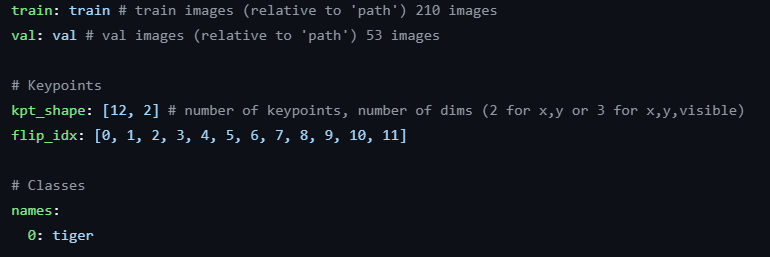

In [ ]:
import yaml

def read_and_display_yaml(file_path):
    """Reads a YAML file and prints its contents."""
    with open(file_path, 'r') as file:
        yaml_content = yaml.safe_load(file)
    
    # Display YAML content
    print(yaml.dump(yaml_content, default_flow_style=False))
    
read_and_display_yaml("/kaggle/working/dataset.yaml")

flip_idx:
- 0
- 1
- 2
- 3
- 4
- 5
- 6
- 7
- 8
- 9
- 10
- 11
kpt_shape:
- 12
- 2
names:
  0: tiger
train: /kaggle/working/yolo_split/train
val: /kaggle/working/yolo_split/val



### Installation of ultralytics:

In [1]:
%pip install ultralytics 

     -------------------------------------- 915.2/915.2 KB 4.2 MB/s eta 0:00:00
     -------------------------------------- 204.1/204.1 MB 3.0 MB/s eta 0:00:00
  Using cached requests-2.32.3-py3-none-any.whl (64 kB)
     --------------------------------------- 11.6/11.6 MB 18.2 MB/s eta 0:00:00
     ---------------------------------------- 46.2/46.2 MB 8.2 MB/s eta 0:00:00
     -------------------------------------- 294.9/294.9 KB 9.2 MB/s eta 0:00:00
     ---------------------------------------- 1.6/1.6 MB 14.1 MB/s eta 0:00:00
     ------------------------------------- 346.8/346.8 KB 21.0 MB/s eta 0:00:00
     ------------------------------------- 507.9/507.9 KB 10.6 MB/s eta 0:00:00
  Using cached urllib3-2.3.0-py3-none-any.whl (128 kB)
     -------------------------------------- 102.8/102.8 KB 5.8 MB/s eta 0:00:00
  Using cached idna-3.10-py3-none-any.whl (70 kB)
  Using cached certifi-2025.1.31-py3-none-any.whl (166 kB)
     ---------------------------------------- 1.6/1.6 MB 17.4

You should consider upgrading via the 'c:\Users\hp\AppData\Local\Programs\Python\Python39\python.exe -m pip install --upgrade pip' command.


In [4]:
%pip uninstall wandb -y

Note: you may need to restart the kernel to use updated packages.


In [5]:
!wget https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo11n-pose.pt

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [ ]:
from ultralytics import YOLO
model = YOLO("/kaggle/working/yolo11n-pose.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Training:

In [ ]:
# Train the model
### check for more arguments: https://docs.ultralytics.com/usage/cfg/#train-settings

results = model.train(data="/kaggle/working/dataset.yaml", epochs=500, imgsz=480, project= "/kaggle/working/training_backup",
                      name="tiger_pose_training", optimizer="AdamW",verbose = True)

Ultralytics 8.3.26 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=pose, mode=train, model=/kaggle/working/yolo11n-pose.pt, data=/kaggle/working/dataset.yaml, epochs=500, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=None, workers=8, project=/kaggle/working/training_backup, name=tiger_pose_training, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_con

100%|██████████| 755k/755k [00:00<00:00, 11.7MB/s]
2024-10-31 15:54:56,989	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-31 15:54:58,320	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml kpt_shape=[17, 3] with kpt_shape=[12, 2]
Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, Tru

100%|██████████| 5.35M/5.35M [00:00<00:00, 52.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/yolo_split/train/labels... 211 images, 0 backgrounds, 0 corrupt: 100%|██████████| 211/211 [00:00<00:00, 730.40it/s]

train: New cache created: /kaggle/working/yolo_split/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.20 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/yolo_split/val/labels... 52 images, 0 backgrounds, 0 corrupt: 100%|██████████| 52/52 [00:00<00:00, 706.94it/s]

val: New cache created: /kaggle/working/yolo_split/val/labels.cache


Plotting labels to /kaggle/working/training_backup/tiger_pose_training/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 4 dataloader workers
Logging results to /kaggle/working/training_backup/tiger_pose_training
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/500       1.6G      1.611      10.23          0      1.898      1.643          8        480: 100%|██████████| 14/14 [00:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]

                   all         52         52     0.0926      0.635     0.0954     0.0342          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/500       1.6G      1.103      9.057          0     0.7459      1.192         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.83it/s]

                   all         52         52     0.0926      0.635     0.0954     0.0342          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/500      1.61G       1.02      8.212          0     0.7138      1.138          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.12it/s]

                   all         52         52     0.0926      0.635     0.0954     0.0342          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/500      1.61G      1.077      7.787          0      0.722      1.155          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.52it/s]

                   all         52         52     0.0926      0.635     0.0954     0.0342          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/500      1.61G     0.9358      7.201          0     0.6314      1.104          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.35it/s]

                   all         52         52     0.0464      0.385      0.034    0.00698          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/500      1.61G     0.9764      6.768          0     0.6578      1.107          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52     0.0464      0.385      0.034    0.00698          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/500      1.61G      0.925      6.326          0     0.6219      1.076          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.18it/s]

                   all         52         52      0.023      0.192     0.0112    0.00271          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/500      1.61G     0.8711      5.936          0     0.6184      1.057          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52     0.0372      0.577     0.0303    0.00776          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/500      1.61G     0.8693      5.914          0     0.6004      1.057          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.04it/s]

                   all         52         52      0.044      0.654     0.0444     0.0142          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/500      1.61G     0.8771      5.356          0     0.5896      1.054          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52        0.3        0.5      0.327       0.11          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/500      1.61G     0.8644      5.575          0     0.5637      1.036         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.00it/s]

                   all         52         52       0.34      0.731      0.342      0.131          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/500      1.61G     0.8779        5.4          0     0.5625      1.067          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         52         52      0.204        0.5       0.18     0.0371          0          0          0          0



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/500      1.61G     0.7992      5.239          0     0.5264      1.023          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.81it/s]


                   all         52         52      0.813          1      0.907      0.703      0.148      0.192      0.041    0.00491

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/500      1.61G     0.7575      5.187          0     0.5029      1.003          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.93it/s]

                   all         52         52      0.872          1      0.994      0.797     0.0669     0.0769       0.01    0.00184



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/500      1.61G     0.7678      5.054          0     0.4982      1.003         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.93it/s]

                   all         52         52      0.602      0.885      0.888      0.664     0.0346     0.0577    0.00862    0.00143



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/500      1.61G      0.792      5.047          0     0.5292      1.036          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.484      0.692      0.476      0.135     0.0258     0.0385    0.00295   0.000295



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/500      1.61G      0.782      4.878          0     0.5077      1.019          9        480: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.80it/s]

                   all         52         52      0.792      0.769      0.923      0.757      0.424      0.442      0.291     0.0643



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/500      1.61G     0.7386      4.713          0     0.4926     0.9761          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]

                   all         52         52      0.958          1      0.995      0.879      0.755      0.808      0.684      0.123



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/500      1.61G     0.7249      4.748          0      0.481     0.9915          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.97it/s]

                   all         52         52      0.858          1      0.989      0.784      0.656      0.712      0.691      0.126



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/500      1.61G     0.7309      4.896          0     0.4826     0.9974          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.69it/s]

                   all         52         52      0.938          1      0.993       0.76      0.799      0.712      0.678      0.126



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/500      1.61G     0.6747      4.614          0     0.4564     0.9728          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.35it/s]

                   all         52         52      0.937          1      0.995      0.812      0.684      0.712      0.617      0.103



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/500      1.61G     0.7452      4.675          0     0.4772     0.9742          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.37it/s]

                   all         52         52      0.811      0.962      0.973      0.637      0.405      0.481      0.308      0.049



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/500      1.61G      0.672      4.372          0     0.4377     0.9499         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.79it/s]

                   all         52         52      0.998          1      0.995      0.852       0.73      0.731      0.719      0.164



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/500      1.61G     0.7222      4.486          0      0.461     0.9783          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.22it/s]

                   all         52         52      0.956          1      0.995      0.777      0.626      0.654      0.503      0.112



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/500      1.61G      0.671      4.356          0     0.4493     0.9627         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         52         52      0.996          1      0.995       0.82      0.805      0.808      0.756      0.161



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/500      1.61G     0.6692      4.186          0     0.4335     0.9645          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.993          1      0.995      0.883      0.688      0.692      0.534      0.105



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/500      1.61G     0.7304       4.42          0     0.4568     0.9734         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         52         52      0.992          1      0.995      0.863      0.877      0.885       0.81      0.164



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/500      1.61G     0.7347      4.438          0     0.4661      1.005          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.927      0.973       0.99      0.658      0.213      0.346      0.125       0.02



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/500      1.61G     0.7023      4.163          0      0.451     0.9808          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.06it/s]


                   all         52         52      0.999          1      0.995      0.865      0.903      0.904      0.826       0.19

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/500      1.61G     0.6956      4.131          0     0.4482     0.9823          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.804       0.75       0.75       0.65      0.141



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/500      1.61G     0.6916      4.229          0     0.4451     0.9789         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.975          1      0.995      0.833      0.453      0.462      0.327      0.064



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/500      1.61G     0.6902      4.271          0     0.4498      0.975         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.992          1      0.995      0.849      0.858      0.865      0.771      0.165



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/500      1.61G     0.6571      4.129          0     0.4197     0.9564          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.71it/s]


                   all         52         52      0.994          1      0.995      0.886      0.841      0.846      0.745      0.136

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/500      1.61G     0.6878      4.272          0     0.4419     0.9696          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.998          1      0.995      0.869       0.73      0.731      0.573      0.131



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/500      1.61G     0.6799      4.072          0     0.4285     0.9763          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.998          1      0.995      0.831      0.749       0.75      0.664      0.127



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/500      1.61G     0.6816      4.186          0     0.4252      0.971          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.995          1      0.995      0.885      0.919      0.923      0.872      0.163



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/500      1.61G     0.6976      4.089          0     0.4266     0.9642          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]

                   all         52         52      0.879          1      0.995      0.857      0.707      0.808      0.678      0.127



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/500      1.61G     0.6729      3.951          0     0.4357     0.9625          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         52         52      0.991          1      0.995      0.881      0.553      0.558      0.327      0.046



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/500      1.61G     0.6732      4.059          0     0.4398     0.9577         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.35it/s]

                   all         52         52      0.995          1      0.995      0.885      0.842      0.846       0.77      0.147



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/500      1.61G     0.6543      3.941          0     0.4338     0.9541          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]

                   all         52         52      0.956          1      0.995      0.825     0.0739     0.0769     0.0127    0.00222



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/500      1.61G     0.7074      3.915          0     0.4767     0.9849          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.28it/s]

                   all         52         52      0.995          1      0.995      0.829      0.211      0.212      0.051    0.00853



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/500      1.61G     0.6499      3.795          0     0.4063     0.9545         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.24it/s]

                   all         52         52       0.87      0.905      0.968      0.601      0.211      0.212     0.0891     0.0162



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/500      1.61G     0.6812      3.867          0     0.4253     0.9622          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.11it/s]

                   all         52         52      0.928          1      0.995      0.849      0.749      0.808      0.747      0.146



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/500      1.61G     0.6525      3.726          0     0.4216     0.9523          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]

                   all         52         52      0.962          1      0.995      0.863      0.814      0.846      0.759      0.151



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/500      1.61G     0.6562      3.806          0     0.4142     0.9473          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.96it/s]

                   all         52         52      0.991          1      0.995       0.89      0.953      0.962      0.938      0.169



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/500      1.61G     0.6679      3.965          0     0.4177     0.9684          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.12it/s]

                   all         52         52      0.576          1      0.949      0.483      0.117      0.269      0.055    0.00895



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/500      1.61G     0.6705      4.038          0     0.4207      0.965          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.91it/s]

                   all         52         52      0.915          1      0.992      0.737      0.353      0.404      0.247      0.039



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/500      1.61G     0.6426      3.945          0     0.4131      0.951          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.36it/s]

                   all         52         52      0.827          1      0.969      0.609      0.155      0.154     0.0807     0.0131



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/500      1.61G     0.6115      3.948          0      0.413     0.9552          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.24it/s]

                   all         52         52      0.994          1      0.995      0.876      0.898      0.904      0.841      0.153



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/500      1.61G     0.6112      3.856          0     0.4013     0.9335         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]

                   all         52         52      0.994          1      0.995      0.896      0.765      0.769      0.624      0.125



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/500      1.61G       0.61       3.62          0     0.3918     0.9533         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.69it/s]

                   all         52         52      0.998          1      0.995      0.896      0.806      0.808      0.669      0.163



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/500      1.61G     0.6136      3.703          0     0.3916     0.9342          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.89it/s]

                   all         52         52      0.999          1      0.995      0.872      0.807      0.808      0.701      0.141



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/500      1.61G     0.5883      3.592          0     0.3876     0.9358          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.36it/s]

                   all         52         52      0.999          1      0.995      0.921      0.884      0.885      0.818      0.191



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/500      1.61G     0.6059      3.882          0     0.3994     0.9542          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]

                   all         52         52      0.998          1      0.995      0.901      0.921      0.923      0.874       0.21



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/500      1.61G     0.5885      3.545          0     0.3906     0.9337          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.924      0.903      0.904      0.857      0.189



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/500      1.61G     0.5809      3.588          0     0.3864     0.9305          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.998          1      0.995      0.926      0.845      0.846        0.8      0.211



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/500      1.61G     0.5846      3.688          0     0.3734     0.9286          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         52         52      0.998          1      0.995       0.91      0.825      0.827      0.737        0.2



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/500      1.61G     0.5866      3.654          0     0.3841     0.9313          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.79it/s]

                   all         52         52      0.998          1      0.995      0.892      0.825      0.827      0.725      0.189



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/500      1.61G     0.5766      3.534          0     0.3795     0.9251         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.97it/s]

                   all         52         52      0.998          1      0.995       0.89      0.787      0.788      0.659      0.153



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/500      1.61G     0.5813      3.674          0     0.3772     0.9315         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.33it/s]

                   all         52         52      0.997          1      0.995        0.9      0.786      0.788      0.663      0.172



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/500      1.61G     0.5769      3.619          0     0.3835     0.9324          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.20it/s]

                   all         52         52      0.983          1      0.995      0.911      0.869      0.885      0.803      0.187



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/500      1.61G     0.5901      3.689          0     0.3806     0.9261         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.998          1      0.995      0.879      0.768      0.769      0.621      0.157



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/500      1.61G     0.6014      3.539          0     0.3994     0.9296          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         52         52      0.997          1      0.995      0.899      0.844      0.846      0.782      0.178



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/500      1.61G     0.5778      3.759          0     0.3706     0.9347         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]

                   all         52         52      0.997          1      0.995      0.913      0.959      0.962      0.945      0.209



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/500      1.61G     0.5825      3.599          0      0.378     0.9264          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         52         52      0.997          1      0.995      0.914      0.959      0.962      0.936      0.192



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/500      1.61G      0.588      3.754          0      0.386      0.926          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.19it/s]

                   all         52         52      0.999          1      0.995      0.897      0.884      0.885      0.814       0.21



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/500      1.61G     0.5995      3.663          0     0.3755     0.9372         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.28it/s]

                   all         52         52      0.999          1      0.995      0.909      0.826      0.827      0.738      0.177



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/500      1.61G     0.5901       3.43          0     0.3738     0.9306          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.35it/s]

                   all         52         52      0.997          1      0.995      0.908      0.786      0.788      0.717       0.17



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/500      1.61G     0.5918      3.555          0      0.382     0.9276          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.35it/s]

                   all         52         52      0.997          1      0.995      0.925      0.882      0.885      0.824      0.219



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/500      1.61G     0.6148      3.619          0     0.3871     0.9272         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.998          1      0.995      0.892      0.902      0.904      0.849      0.219



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/500      1.61G     0.6127      3.473          0     0.3836      0.947          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         52         52      0.998          1      0.995      0.884      0.825      0.827       0.74      0.166



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/500      1.61G     0.6098      3.601          0     0.3815     0.9448          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         52         52      0.998          1      0.995      0.887      0.902      0.904      0.867      0.212



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/500      1.61G     0.5786      3.451          0     0.3663     0.9413          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.926      0.922      0.923       0.89      0.231



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/500      1.61G     0.5792      3.601          0     0.3715     0.9228          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995       0.89      0.864      0.865      0.782       0.21



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/500      1.61G     0.6026      3.491          0     0.3886     0.9576          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.05it/s]

                   all         52         52      0.999          1      0.995      0.894      0.884      0.885      0.809      0.228



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/500      1.61G      0.602      3.502          0     0.3781     0.9247          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.37it/s]

                   all         52         52      0.999          1      0.995      0.892      0.884      0.885      0.801      0.189



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/500      1.61G     0.5665      3.476          0      0.362     0.9386          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.893      0.884      0.885      0.813      0.201



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/500      1.61G     0.5754      3.369          0     0.3673      0.925          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995       0.92      0.903      0.904      0.849      0.217



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/500      1.61G     0.5428      3.362          0     0.3633     0.9213         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]

                   all         52         52      0.999          1      0.995        0.9       0.96      0.962      0.954      0.252



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/500      1.61G     0.5542        3.4          0     0.3674     0.9174          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.41it/s]

                   all         52         52      0.999          1      0.995      0.936      0.961      0.962      0.953      0.218



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/500      1.61G     0.5422      3.193          0     0.3479     0.9303          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


                   all         52         52      0.999          1      0.995        0.9      0.961      0.962      0.952      0.242

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/500      1.61G     0.5247       3.33          0     0.3476     0.9118          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.80it/s]

                   all         52         52      0.999          1      0.995      0.927      0.922      0.923      0.891      0.217



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/500      1.61G     0.5299      3.376          0     0.3481     0.9133          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.999          1      0.995      0.897      0.922      0.923      0.874      0.213



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/500      1.61G     0.5247      3.404          0     0.3396     0.9143         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.37it/s]

                   all         52         52      0.999          1      0.995       0.92      0.884      0.885      0.819      0.231



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/500      1.61G     0.5348      3.385          0     0.3365     0.9145         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.29it/s]

                   all         52         52      0.999          1      0.995      0.896      0.922      0.923      0.884      0.248



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/500      1.61G     0.5384       3.48          0     0.3511     0.9323          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.913       0.96      0.962      0.957      0.232



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/500      1.61G     0.5427      3.383          0     0.3554     0.9193         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all         52         52      0.999          1      0.995      0.911      0.922      0.923      0.894      0.211



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/500      1.61G     0.5556      3.421          0     0.3556     0.9282          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.01it/s]

                   all         52         52      0.999          1      0.995      0.898      0.922      0.923      0.888      0.245



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/500      1.61G      0.516      3.366          0     0.3419     0.9128          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.05it/s]

                   all         52         52      0.999          1      0.995      0.901       0.96      0.962      0.948      0.227



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/500      1.61G     0.5264      3.504          0     0.3472     0.9186         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.86it/s]

                   all         52         52      0.999          1      0.995      0.908      0.845      0.846      0.757      0.202



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/500      1.61G     0.5681       3.57          0     0.3628     0.9344          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.13it/s]

                   all         52         52      0.997          1      0.995      0.909      0.863      0.865      0.795      0.181



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/500      1.61G     0.5535      3.435          0     0.3576     0.9171          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]

                   all         52         52      0.991          1      0.995      0.901      0.897      0.904       0.91      0.219



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/500      1.61G     0.5561      3.353          0     0.3601     0.9031          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.01it/s]

                   all         52         52      0.943          1      0.995      0.903      0.907      0.962      0.958      0.266



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/500      1.61G     0.5584      3.449          0     0.3568     0.9273          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.996          1      0.995      0.901      0.843      0.846      0.755      0.173



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/500      1.61G     0.5602      3.568          0     0.3563      0.914          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.04it/s]

                   all         52         52      0.998          1      0.995      0.917       0.96      0.962      0.948      0.243



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/500      1.61G     0.5477      3.656          0     0.3602      0.921          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]

                   all         52         52      0.999          1      0.995      0.908       0.96      0.962      0.942      0.225



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/500      1.61G     0.5779      3.508          0     0.3671     0.9242          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         52         52      0.999          1      0.995      0.921       0.96      0.962      0.944      0.232



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/500      1.61G     0.5794      3.441          0     0.3563      0.907         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.27it/s]

                   all         52         52      0.999          1      0.995      0.891       0.98      0.981      0.975      0.236



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/500      1.61G     0.5714      3.487          0     0.3692     0.9251         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         52         52      0.999          1      0.995      0.902       0.98      0.981      0.974      0.272



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/500      1.61G     0.5899      3.576          0      0.365     0.9394          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.11it/s]

                   all         52         52      0.999          1      0.995      0.907       0.96      0.962      0.955      0.297



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    101/500      1.61G     0.5748      3.537          0     0.3672     0.9317          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]

                   all         52         52      0.999          1      0.995      0.893       0.96      0.962      0.953      0.289



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    102/500      1.62G     0.5586      3.409          0      0.355     0.9252          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.877       0.96      0.962      0.947      0.278



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    103/500      1.61G     0.5457      3.319          0     0.3558     0.9334          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]

                   all         52         52      0.999          1      0.995      0.898       0.96      0.962      0.941      0.272



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    104/500      1.61G     0.5599        3.6          0     0.3543     0.9163          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.998          1      0.995      0.938       0.96      0.962       0.94      0.277



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    105/500      1.61G      0.521      3.277          0     0.3512     0.9066          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.923       0.96      0.962      0.941      0.277



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    106/500      1.61G      0.517      3.331          0     0.3435     0.9182          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.998          1      0.995      0.894       0.96      0.962      0.938      0.273



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    107/500      1.61G     0.5454      3.423          0     0.3486     0.9204         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]

                   all         52         52      0.999          1      0.995      0.929       0.96      0.962      0.943      0.295



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    108/500      1.61G     0.5069      3.198          0     0.3441     0.9056         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.39it/s]

                   all         52         52      0.999          1      0.995      0.927       0.96      0.962      0.948      0.261



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    109/500      1.61G     0.4979      3.272          0     0.3381     0.9081          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.68it/s]

                   all         52         52      0.999          1      0.995      0.916       0.96      0.962      0.942      0.291



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    110/500      1.61G     0.5072      3.347          0     0.3441     0.9091          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.907       0.98      0.981      0.971      0.303



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    111/500      1.61G     0.5085      3.175          0     0.3327     0.9005         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.925       0.98      0.981      0.969      0.326



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    112/500      1.61G     0.5046      3.181          0     0.3328     0.9016          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.921       0.98      0.981      0.971      0.344



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    113/500      1.61G     0.5177      3.186          0     0.3342     0.9173         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.27it/s]

                   all         52         52      0.999          1      0.995      0.919       0.96      0.962      0.941      0.304



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    114/500      1.61G     0.5091      3.432          0     0.3402     0.9051          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.45it/s]

                   all         52         52      0.999          1      0.995      0.914       0.98      0.981      0.978      0.303



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    115/500      1.61G     0.4949      3.101          0      0.328     0.8884          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.79it/s]

                   all         52         52      0.999          1      0.995      0.911      0.999          1      0.995      0.336



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    116/500      1.61G     0.5294      3.251          0     0.3509     0.9168          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.44it/s]

                   all         52         52      0.999          1      0.995      0.929      0.999          1      0.995      0.316



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    117/500      1.61G      0.502      3.225          0     0.3417        0.9          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.67it/s]

                   all         52         52      0.999          1      0.995      0.932       0.98      0.981       0.97      0.293



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    118/500      1.61G     0.5079      3.422          0      0.339     0.9172          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         52         52      0.985          1      0.995      0.926      0.985          1      0.995      0.318



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    119/500      1.61G     0.5286      3.096          0      0.341     0.9213          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.10it/s]

                   all         52         52      0.995          1      0.995      0.927      0.995          1      0.995      0.371



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    120/500      1.61G     0.5295      3.224          0     0.3489      0.923          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.999          1      0.995      0.925      0.999          1      0.995      0.392



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    121/500      1.61G      0.503      3.088          0     0.3269     0.9108          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.926      0.999          1      0.995      0.394



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    122/500      1.61G     0.5056      3.162          0     0.3219     0.9267          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.11it/s]

                   all         52         52      0.999          1      0.995      0.936      0.999          1      0.995      0.408



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    123/500      1.61G     0.5021      2.978          0     0.3277     0.9059         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.44it/s]

                   all         52         52      0.999          1      0.995      0.918      0.999          1      0.995      0.432



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    124/500      1.61G      0.518      2.859          0     0.3372     0.9057          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.66it/s]

                   all         52         52      0.999          1      0.995      0.934      0.999          1      0.995      0.456



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    125/500      1.61G     0.5286      2.684          0     0.3425     0.9144         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.45it/s]

                   all         52         52      0.992          1      0.995      0.915      0.992          1      0.995      0.393



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    126/500      1.61G     0.5205       2.93          0     0.3481     0.9122          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.999          1      0.995      0.929      0.999          1      0.995      0.451



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    127/500      1.61G     0.5122      2.659          0     0.3446     0.9021          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.90it/s]

                   all         52         52      0.999          1      0.995      0.933      0.999          1      0.995      0.458



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    128/500      1.61G     0.5094      2.859          0     0.3452     0.9256          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.89it/s]

                   all         52         52      0.999          1      0.995      0.905      0.999          1      0.995      0.448



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    129/500      1.61G     0.5063      2.793          0     0.3343      0.911          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         52         52      0.999          1      0.995      0.931      0.999          1      0.995      0.465



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    130/500      1.61G     0.4996      2.749          0     0.3295     0.9151          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.08it/s]

                   all         52         52      0.999          1      0.995      0.926      0.999          1      0.995      0.427



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    131/500      1.61G     0.5201      2.703          0     0.3368     0.9074          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]

                   all         52         52      0.999          1      0.995      0.936      0.999          1      0.995      0.421



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    132/500      1.61G     0.5567      2.627          0     0.3623     0.9287          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.888      0.999          1      0.995      0.365



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    133/500      1.61G     0.5303      2.623          0      0.341     0.9171         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]

                   all         52         52      0.999          1      0.995      0.926      0.999          1      0.995      0.459



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    134/500      1.61G     0.5514      2.492          0     0.3507     0.9219          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         52         52      0.999          1      0.995      0.907      0.999          1      0.995      0.458



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    135/500      1.61G     0.4933      2.605          0     0.3244     0.8999          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.44it/s]

                   all         52         52      0.999          1      0.995      0.923      0.999          1      0.995      0.465



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    136/500      1.61G     0.5114      2.479          0     0.3401     0.9176          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.999          1      0.995      0.938      0.999          1      0.995      0.487



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    137/500      1.61G     0.4998      2.544          0     0.3323     0.9019          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         52         52      0.999          1      0.995      0.934      0.999          1      0.995      0.501



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    138/500      1.61G     0.4914      2.572          0     0.3315     0.8864          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.80it/s]

                   all         52         52      0.999          1      0.995      0.946      0.999          1      0.995       0.45



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    139/500      1.61G     0.5036      2.358          0     0.3306     0.9073         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.23it/s]

                   all         52         52      0.999          1      0.995      0.916      0.999          1      0.995      0.419



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    140/500      1.61G     0.5116      2.494          0     0.3433     0.9128          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.20it/s]

                   all         52         52      0.999          1      0.995      0.926      0.999          1      0.995      0.502



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    141/500      1.61G     0.4987      2.375          0     0.3284     0.8958          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.11it/s]

                   all         52         52      0.999          1      0.995      0.945      0.999          1      0.995      0.449



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    142/500      1.61G     0.5023      2.558          0     0.3271     0.8966         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         52         52      0.999          1      0.995      0.939      0.999          1      0.995      0.468



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    143/500      1.61G     0.4981      2.465          0     0.3237     0.9037         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.999          1      0.995      0.938      0.999          1      0.995      0.492



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    144/500      1.61G     0.4868      2.491          0     0.3133      0.904          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.44it/s]

                   all         52         52      0.999          1      0.995      0.957      0.999          1      0.995      0.455



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    145/500      1.61G     0.4825      2.372          0     0.3171     0.8926         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.20it/s]

                   all         52         52      0.998          1      0.995       0.93      0.998          1      0.995      0.481



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    146/500      1.61G     0.5204      2.495          0     0.3348     0.9049         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.11it/s]

                   all         52         52      0.999          1      0.995      0.936      0.999          1      0.995       0.48



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    147/500      1.61G     0.4814       2.32          0     0.3204     0.8869          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.24it/s]

                   all         52         52      0.998          1      0.995      0.946      0.998          1      0.995      0.487



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    148/500      1.61G      0.475      2.456          0     0.3172      0.906          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.35it/s]

                   all         52         52      0.999          1      0.995       0.92      0.999          1      0.995      0.506



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    149/500      1.61G     0.4675      2.366          0     0.3077     0.8991          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         52         52      0.999          1      0.995      0.949      0.999          1      0.995      0.487



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    150/500      1.61G     0.4815      2.519          0     0.3214      0.904          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.81it/s]

                   all         52         52      0.999          1      0.995      0.923      0.999          1      0.995       0.51



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    151/500      1.61G     0.4787      2.426          0     0.3113     0.9001         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.31it/s]

                   all         52         52      0.999          1      0.995      0.936      0.999          1      0.995      0.508



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    152/500      1.61G     0.4774       2.36          0     0.3218     0.9025          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.90it/s]

                   all         52         52      0.998          1      0.995      0.932      0.998          1      0.995      0.504



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    153/500      1.61G     0.4807      2.409          0     0.3169     0.9039          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]

                   all         52         52      0.999          1      0.995      0.933      0.999          1      0.995      0.491



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    154/500      1.61G     0.4778      2.372          0     0.3259     0.9095          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.48it/s]

                   all         52         52      0.999          1      0.995      0.925      0.999          1      0.995      0.492



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    155/500      1.61G     0.5213      2.468          0      0.344     0.9133          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.23it/s]

                   all         52         52      0.999          1      0.995      0.937      0.999          1      0.995       0.48



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    156/500      1.61G     0.4862      2.298          0     0.3279     0.8918          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.36it/s]

                   all         52         52      0.999          1      0.995      0.932      0.999          1      0.995      0.457



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    157/500      1.61G     0.4781      2.343          0     0.3288     0.8973          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]

                   all         52         52      0.999          1      0.995      0.926      0.826      0.827      0.733      0.275



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    158/500      1.61G      0.493      2.564          0     0.3303     0.9064         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.29it/s]

                   all         52         52      0.999          1      0.995      0.916      0.999          1      0.995      0.498



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    159/500      1.61G     0.4766       2.53          0     0.3203     0.8945          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.56it/s]

                   all         52         52      0.999          1      0.995      0.934      0.999          1      0.995        0.5



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    160/500      1.61G     0.4711      2.435          0     0.3116     0.9005          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995      0.946      0.999          1      0.995      0.516



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    161/500      1.61G     0.4702      2.347          0     0.3253     0.9151          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         52         52      0.999          1      0.995      0.934      0.999          1      0.995      0.518



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    162/500      1.61G     0.4904      2.384          0     0.3188     0.8925          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995      0.926      0.999          1      0.995      0.527



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    163/500      1.61G     0.4904      2.322          0      0.326      0.904          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.935      0.999          1      0.995      0.519



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    164/500      1.61G      0.473      2.393          0     0.3163     0.9079          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.39it/s]

                   all         52         52      0.999          1      0.995      0.937      0.999          1      0.995      0.524



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    165/500      1.61G     0.4653      2.364          0     0.3212     0.9135          5        480: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.928      0.999          1      0.995      0.545



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    166/500      1.61G     0.4852      2.225          0     0.3131     0.9096          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.73it/s]

                   all         52         52      0.999          1      0.995      0.941      0.999          1      0.995      0.532



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    167/500      1.61G     0.4809       2.39          0     0.3176     0.9002          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.998          1      0.995      0.934      0.998          1      0.995      0.541



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    168/500      1.61G     0.4712      2.177          0     0.3151     0.9016          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.48it/s]

                   all         52         52      0.999          1      0.995      0.922      0.999          1      0.995      0.544



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    169/500      1.61G      0.479      2.236          0      0.319      0.883          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.73it/s]

                   all         52         52      0.999          1      0.995      0.941      0.999          1      0.995      0.532



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    170/500      1.61G       0.46      2.381          0     0.3099     0.8875          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.939      0.999          1      0.995      0.545



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    171/500      1.61G     0.4776      2.161          0     0.3259     0.9028          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.533



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    172/500      1.61G      0.465      2.109          0     0.3142     0.8987          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.943      0.999          1      0.995      0.479



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    173/500      1.61G     0.5008      2.211          0     0.3317     0.9148          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.98it/s]

                   all         52         52      0.998          1      0.995      0.947      0.998          1      0.995      0.528



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    174/500      1.61G     0.4756      2.236          0     0.3231     0.9108          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.60it/s]

                   all         52         52      0.999          1      0.995      0.919      0.999          1      0.995       0.54



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    175/500      1.61G     0.4751      2.228          0     0.3097     0.8952         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.44it/s]

                   all         52         52      0.999          1      0.995      0.934      0.999          1      0.995      0.527



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    176/500      1.61G      0.477      1.991          0     0.3295     0.8932          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         52         52      0.999          1      0.995      0.933      0.999          1      0.995      0.542



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    177/500      1.61G     0.4767      2.121          0     0.3297     0.9084          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.31it/s]

                   all         52         52      0.999          1      0.995       0.93      0.999          1      0.995      0.544



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    178/500      1.61G     0.4715      2.145          0      0.316     0.8942          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.08it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.547



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    179/500      1.61G     0.4557      2.199          0     0.3085     0.8963          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.29it/s]

                   all         52         52      0.999          1      0.995      0.933      0.999          1      0.995      0.507



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    180/500      1.61G     0.4563      2.288          0      0.309     0.8946          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.927      0.999          1      0.995      0.549



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    181/500      1.61G     0.4679      2.128          0     0.3178     0.8867         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.22it/s]

                   all         52         52      0.999          1      0.995      0.937      0.999          1      0.995       0.56



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    182/500      1.61G     0.4728      2.132          0     0.3206     0.8953          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.523



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    183/500      1.61G     0.4626      2.321          0     0.3161     0.8959          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.941      0.999          1      0.995      0.555



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    184/500      1.61G     0.4419      2.154          0      0.296     0.8946          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.948      0.999          1      0.995      0.555



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    185/500      1.61G     0.4414      1.978          0     0.2926     0.8958          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.554



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    186/500      1.61G     0.4382      2.087          0     0.2952     0.8913          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995      0.954      0.999          1      0.995      0.517



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    187/500      1.61G     0.4272      2.153          0     0.3016     0.8878         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.999          1      0.995      0.964      0.999          1      0.995      0.586



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    188/500      1.61G     0.4319      2.091          0     0.3048     0.8942          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.79it/s]

                   all         52         52      0.999          1      0.995      0.937      0.999          1      0.995      0.581



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    189/500      1.61G     0.4278       2.06          0     0.2929     0.8924         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.56it/s]

                   all         52         52      0.999          1      0.995      0.931      0.999          1      0.995      0.594



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    190/500      1.61G     0.4317      1.875          0      0.291     0.8759          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]

                   all         52         52      0.999          1      0.995       0.94      0.999          1      0.995      0.591



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    191/500      1.61G     0.4414      2.142          0     0.2964     0.8891         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]

                   all         52         52      0.999          1      0.995       0.95      0.999          1      0.995      0.609



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    192/500      1.61G     0.4385      2.018          0     0.2903     0.9054          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.87it/s]

                   all         52         52      0.999          1      0.995      0.942      0.999          1      0.995      0.606



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    193/500      1.61G     0.4562      1.961          0     0.2977     0.9084          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         52         52      0.999          1      0.995      0.945      0.999          1      0.995       0.62



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    194/500      1.61G     0.4548      1.985          0     0.2952     0.8838         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.72it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.602



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    195/500      1.61G     0.4241      1.961          0     0.2915     0.8873          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.22it/s]

                   all         52         52      0.999          1      0.995      0.945      0.999          1      0.995      0.623



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    196/500      1.61G     0.4704      1.937          0     0.3148     0.8954         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.92it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.627



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    197/500      1.61G     0.4396      1.944          0     0.2975     0.9038          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.937      0.999          1      0.995      0.625



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    198/500      1.61G     0.4337      1.941          0     0.2935     0.8792         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.74it/s]

                   all         52         52      0.999          1      0.995      0.963      0.999          1      0.995      0.639



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    199/500      1.61G     0.4295      2.018          0     0.2922     0.8818          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.56it/s]

                   all         52         52      0.999          1      0.995      0.939      0.999          1      0.995      0.617



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    200/500      1.61G     0.4357      1.978          0     0.2984     0.8846          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.11it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.647



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    201/500      1.61G     0.4412      1.974          0     0.3021     0.8929          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.999          1      0.995      0.956      0.999          1      0.995      0.624



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    202/500      1.61G     0.4162      1.884          0      0.297      0.894         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.88it/s]

                   all         52         52      0.999          1      0.995      0.958      0.999          1      0.995      0.637



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    203/500      1.61G     0.4388      1.855          0     0.2939     0.8844          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.19it/s]

                   all         52         52      0.999          1      0.995      0.974      0.999          1      0.995      0.624



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    204/500      1.61G     0.4148      1.909          0     0.2899     0.8931          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995       0.94      0.999          1      0.995      0.651



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    205/500      1.61G     0.4307       1.81          0     0.3006     0.8848          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.93it/s]

                   all         52         52      0.999          1      0.995      0.941      0.999          1      0.995      0.654



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    206/500      1.61G     0.4367      1.955          0     0.3003     0.8835         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995      0.961      0.999          1      0.995      0.631



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    207/500      1.61G     0.4345      1.864          0     0.2997      0.891          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.07it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.648



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    208/500      1.61G     0.4336      2.011          0     0.2883     0.8826         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.66it/s]

                   all         52         52      0.999          1      0.995       0.95      0.999          1      0.995      0.645



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    209/500      1.61G     0.4324      2.009          0     0.3007     0.8955          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.87it/s]

                   all         52         52      0.999          1      0.995      0.972      0.999          1      0.995      0.627



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    210/500      1.61G      0.409      1.851          0     0.2886     0.8916         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.974      0.999          1      0.995      0.647



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    211/500      1.61G     0.3984      1.937          0      0.291     0.8791          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.655



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    212/500      1.62G      0.406       1.74          0     0.2821     0.8756          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.82it/s]

                   all         52         52      0.999          1      0.995      0.948      0.999          1      0.995      0.638



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    213/500      1.61G     0.4193      1.956          0     0.2942     0.8875          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.964      0.999          1      0.995       0.65



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    214/500      1.61G     0.4217      1.844          0     0.2923     0.8855          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.939      0.999          1      0.995      0.663



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    215/500      1.61G     0.4352      1.902          0     0.2946     0.8921          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.48it/s]

                   all         52         52      0.999          1      0.995      0.943      0.999          1      0.995      0.657



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    216/500      1.61G     0.4274      1.803          0     0.2908     0.8983          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.999          1      0.995       0.95      0.999          1      0.995      0.634



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    217/500      1.61G     0.4399      1.941          0     0.3053     0.8834          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.645



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    218/500      1.61G     0.4183       1.74          0     0.2858     0.8823          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         52         52      0.999          1      0.995      0.953      0.999          1      0.995      0.616



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    219/500      1.61G     0.4271       1.92          0     0.2959     0.8899          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.953      0.999          1      0.995      0.655



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    220/500      1.61G     0.4207        1.8          0     0.2875     0.8877          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]


                   all         52         52      0.999          1      0.995      0.938      0.999          1      0.995      0.648

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    221/500      1.61G     0.4283      1.813          0     0.2933     0.8882          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.04it/s]

                   all         52         52      0.999          1      0.995      0.921      0.999          1      0.995      0.637



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    222/500      1.61G     0.4273      1.949          0     0.2856     0.8777         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.649



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    223/500      1.61G     0.4408      1.873          0     0.2875     0.8911         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.658



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    224/500      1.61G     0.4152      1.742          0     0.2852     0.8815          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.75it/s]

                   all         52         52      0.999          1      0.995      0.964      0.999          1      0.995      0.666



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    225/500      1.61G     0.4145      1.767          0     0.2841     0.8815         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.652



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    226/500      1.61G      0.399      1.704          0      0.274     0.8778          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995       0.96      0.999          1      0.995      0.677



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    227/500      1.61G     0.4115       1.82          0     0.2808      0.877          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         52         52      0.999          1      0.995      0.969      0.999          1      0.995      0.639



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    228/500      1.61G     0.4133      1.753          0     0.2868     0.8874          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.12it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.645



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    229/500      1.61G     0.4197      1.676          0     0.2854     0.8938         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.56it/s]

                   all         52         52      0.999          1      0.995      0.949      0.999          1      0.995      0.668



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    230/500      1.61G     0.4153      1.773          0     0.2897     0.8757         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.999          1      0.995      0.969      0.999          1      0.995      0.651



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    231/500      1.61G     0.3839      1.766          0     0.2742     0.8792          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995      0.952      0.999          1      0.995      0.635



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    232/500      1.61G      0.406      1.772          0     0.2796     0.8771          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.955      0.999          1      0.995      0.665



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    233/500      1.61G     0.4081      1.778          0     0.2893     0.8632         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995       0.93      0.999          1      0.995      0.666



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    234/500      1.61G     0.3942      1.666          0     0.2741     0.8658          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.62it/s]

                   all         52         52      0.999          1      0.995      0.959      0.999          1      0.995      0.653



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    235/500      1.61G     0.4085      1.635          0     0.2846     0.8801          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.07it/s]

                   all         52         52      0.999          1      0.995      0.956      0.999          1      0.995       0.66



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    236/500      1.61G     0.3939      1.756          0     0.2817     0.8702          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.672



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    237/500      1.61G     0.3961       1.68          0     0.2748      0.874          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.65it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.636



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    238/500      1.61G     0.3929      1.756          0     0.2748     0.8828          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]

                   all         52         52      0.999          1      0.995      0.947      0.999          1      0.995      0.636



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    239/500      1.61G     0.4039      1.737          0      0.287     0.8756         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995       0.95      0.999          1      0.995      0.674



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    240/500      1.61G     0.4056      1.898          0     0.2731     0.8764         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.76it/s]

                   all         52         52      0.999          1      0.995      0.944      0.999          1      0.995      0.681



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    241/500      1.61G     0.3949      1.732          0     0.2816     0.8717          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.999          1      0.995      0.951      0.999          1      0.995      0.656



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    242/500      1.61G     0.4335       1.71          0     0.2924     0.8844          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.999          1      0.995      0.962      0.999          1      0.995      0.682



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    243/500      1.61G     0.4237      1.749          0     0.2874     0.8878          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.921      0.999          1      0.995      0.683



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    244/500      1.61G     0.4006      1.786          0     0.2868     0.8889          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.23it/s]

                   all         52         52      0.999          1      0.995      0.954      0.999          1      0.995      0.675



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    245/500      1.61G     0.3825      1.695          0     0.2726     0.8936          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.45it/s]

                   all         52         52      0.999          1      0.995      0.957      0.999          1      0.995      0.665



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    246/500      1.61G     0.3925      1.645          0     0.2753     0.8724          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.97it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995      0.677



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    247/500      1.61G      0.386      1.661          0     0.2778     0.8794          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.999          1      0.995      0.944      0.999          1      0.995       0.69



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    248/500      1.61G     0.3911      1.808          0     0.2796     0.8631         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.72it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995      0.668



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    249/500      1.61G      0.374      1.735          0     0.2775     0.8704         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.28it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995      0.683



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    250/500      1.61G     0.3884      1.822          0      0.274     0.8741          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.82it/s]

                   all         52         52      0.999          1      0.995      0.955      0.999          1      0.995      0.667



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    251/500      1.61G     0.3672      1.778          0     0.2638     0.8652          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.948      0.999          1      0.995      0.667



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    252/500      1.61G      0.422      1.822          0     0.2958       0.88         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.968      0.999          1      0.995      0.673



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    253/500      1.61G     0.3755       1.58          0     0.2722     0.8738          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.957      0.999          1      0.995      0.686



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    254/500      1.61G     0.4068      1.712          0     0.2821     0.8888          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995      0.961      0.999          1      0.995      0.688



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    255/500      1.61G     0.3641      1.516          0     0.2712     0.8654          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]

                   all         52         52      0.999          1      0.995      0.964      0.999          1      0.995      0.686



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    256/500      1.61G      0.386      1.596          0     0.2707     0.8797          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.65it/s]

                   all         52         52      0.999          1      0.995      0.954      0.999          1      0.995      0.679



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    257/500      1.61G     0.3846      1.616          0     0.2725     0.8683          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.964      0.999          1      0.995      0.695



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    258/500      1.61G     0.3982      1.602          0      0.282     0.8805          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995      0.961      0.999          1      0.995      0.689



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    259/500      1.61G     0.3979      1.738          0       0.27     0.8752          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.08it/s]

                   all         52         52      0.999          1      0.995      0.952      0.999          1      0.995      0.681



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    260/500      1.61G     0.3793      1.712          0     0.2723     0.8745          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995       0.69



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    261/500      1.61G     0.3693      1.658          0     0.2637      0.876          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.969      0.999          1      0.995      0.692



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    262/500      1.61G     0.3843      1.692          0     0.2638     0.8726          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995       0.96      0.999          1      0.995      0.693



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    263/500      1.61G     0.3857      1.678          0     0.2756     0.8819          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.41it/s]

                   all         52         52      0.999          1      0.995      0.968      0.999          1      0.995      0.701



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    264/500      1.61G     0.3741      1.799          0      0.268     0.8733          5        480: 100%|██████████| 14/14 [00:02<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.948      0.999          1      0.995      0.669



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    265/500      1.61G     0.3639      1.621          0      0.263     0.8655          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]

                   all         52         52      0.999          1      0.995      0.961      0.999          1      0.995      0.677



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    266/500      1.61G     0.3663      1.494          0      0.267     0.8728          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995        0.7



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    267/500      1.61G     0.3867      1.802          0     0.2747     0.8803          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.60it/s]

                   all         52         52      0.999          1      0.995      0.965      0.999          1      0.995      0.696



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    268/500      1.61G     0.3752      1.731          0     0.2635     0.8716         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.978      0.999          1      0.995      0.668



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    269/500      1.61G     0.3906      1.738          0     0.2697     0.8719          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995      0.959      0.999          1      0.995      0.656



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    270/500      1.61G     0.3772      1.673          0     0.2712      0.875         12        480: 100%|██████████| 14/14 [00:02<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.26it/s]

                   all         52         52      0.999          1      0.995      0.953      0.999          1      0.995      0.682



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    271/500      1.61G     0.3769      1.719          0     0.2732     0.8677          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.47it/s]

                   all         52         52      0.999          1      0.995      0.943      0.999          1      0.995      0.682



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    272/500      1.61G     0.3692      1.696          0       0.26      0.865          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]

                   all         52         52      0.999          1      0.995      0.972      0.999          1      0.995      0.693



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    273/500      1.61G     0.3819      1.535          0     0.2648     0.8775          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.84it/s]

                   all         52         52      0.999          1      0.995      0.971      0.999          1      0.995      0.685



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    274/500      1.61G     0.3671      1.644          0      0.254     0.8733          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.973      0.999          1      0.995      0.686



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    275/500      1.61G     0.3876      1.733          0     0.2724     0.8872          6        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.29it/s]

                   all         52         52      0.999          1      0.995      0.972      0.999          1      0.995      0.686



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    276/500      1.61G     0.3598      1.762          0      0.266     0.8797         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.691



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    277/500      1.61G      0.351      1.562          0     0.2494     0.8569          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.12it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.678



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    278/500      1.61G     0.3517      1.701          0     0.2588     0.8761          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.39it/s]

                   all         52         52      0.999          1      0.995      0.957      0.999          1      0.995      0.688



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    279/500      1.61G     0.3755      1.634          0     0.2608     0.8641          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.97it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995      0.695



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    280/500      1.61G     0.3937      1.716          0      0.271     0.8811         11        480: 100%|██████████| 14/14 [00:02<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995      0.695



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    281/500      1.61G     0.3812       1.59          0     0.2671     0.8764          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]

                   all         52         52      0.999          1      0.995      0.958      0.999          1      0.995      0.701



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    282/500      1.61G     0.3704      1.593          0      0.263     0.8774         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.73it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.688



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    283/500      1.61G     0.3564      1.557          0     0.2591     0.8689         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.28it/s]

                   all         52         52      0.999          1      0.995      0.972      0.999          1      0.995      0.683



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    284/500      1.61G     0.3701      1.549          0     0.2644     0.8766         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.90it/s]

                   all         52         52      0.999          1      0.995      0.939      0.999          1      0.995      0.682



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    285/500      1.61G     0.3574      1.652          0     0.2574     0.8718         12        480: 100%|██████████| 14/14 [00:02<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.66it/s]

                   all         52         52      0.999          1      0.995      0.943      0.999          1      0.995      0.656



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    286/500      1.61G     0.3722      1.681          0     0.2619      0.875         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.82it/s]

                   all         52         52      0.999          1      0.995      0.973      0.999          1      0.995      0.685



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    287/500      1.61G     0.3758      1.614          0     0.2722     0.8791          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.28it/s]

                   all         52         52      0.998          1      0.995      0.977      0.998          1      0.995      0.696



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    288/500      1.61G     0.3675      1.813          0     0.2626     0.8708         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]

                   all         52         52      0.998          1      0.995      0.975      0.998          1      0.995      0.692



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    289/500      1.61G     0.3597      1.624          0     0.2575     0.8735          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.39it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.691



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    290/500      1.61G      0.362      1.659          0     0.2597     0.8831          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.684



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    291/500      1.61G     0.3564      1.656          0     0.2504     0.8725         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         52         52      0.999          1      0.995      0.967      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    292/500      1.61G     0.3538      1.642          0     0.2532     0.8529         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.83it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.703



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    293/500      1.61G     0.3689      1.622          0     0.2622     0.8758         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.93it/s]

                   all         52         52      0.999          1      0.995      0.967      0.999          1      0.995      0.692



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    294/500      1.61G     0.3626      1.542          0     0.2482     0.8761          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.965      0.999          1      0.995      0.689



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    295/500      1.61G     0.3601      1.539          0     0.2507     0.8757         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         52         52      0.999          1      0.995      0.957      0.999          1      0.995      0.689



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    296/500      1.61G     0.3695      1.497          0     0.2631     0.8805          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995        0.7



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    297/500      1.61G     0.3645      1.453          0       0.26     0.8702         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995      0.695



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    298/500      1.61G     0.3589      1.712          0       0.25     0.8831          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    299/500      1.61G     0.3619      1.516          0     0.2501     0.8664          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all         52         52      0.999          1      0.995      0.974      0.999          1      0.995      0.693



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    300/500      1.61G     0.3358      1.657          0     0.2446     0.8606          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.83it/s]

                   all         52         52      0.999          1      0.995      0.968      0.999          1      0.995      0.681



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    301/500      1.61G     0.3374      1.405          0     0.2585     0.8501          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995      0.674



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    302/500      1.61G     0.3682      1.461          0     0.2605     0.8699          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.17it/s]

                   all         52         52      0.999          1      0.995       0.97      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    303/500      1.61G     0.3597      1.594          0     0.2522     0.8735          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.974      0.999          1      0.995      0.703



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    304/500      1.61G     0.3539      1.554          0     0.2611     0.8755          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.37it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.702



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    305/500      1.61G     0.3426      1.527          0     0.2507     0.8572          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.45it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.698



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    306/500      1.61G     0.3614       1.59          0     0.2546     0.8836          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         52         52      0.999          1      0.995      0.968      0.999          1      0.995      0.696



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    307/500      1.61G     0.3599      1.573          0     0.2529     0.8543          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.02it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995      0.691



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    308/500      1.61G     0.3461      1.481          0     0.2578     0.8649         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.699



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    309/500      1.61G     0.3601      1.606          0      0.255     0.8615          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.999          1      0.995      0.966      0.999          1      0.995      0.705



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    310/500      1.61G     0.3312      1.556          0     0.2421     0.8701          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.998          1      0.995      0.968      0.998          1      0.995      0.684



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    311/500      1.61G     0.3389      1.569          0     0.2501     0.8745         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.20it/s]

                   all         52         52      0.998          1      0.995      0.974      0.998          1      0.995      0.689



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    312/500      1.61G     0.3583      1.513          0     0.2572     0.8767          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.75it/s]

                   all         52         52      0.998          1      0.995      0.987      0.998          1      0.995      0.699



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    313/500      1.61G     0.3629      1.523          0     0.2536     0.8723          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    314/500      1.61G     0.3611      1.649          0     0.2589     0.8741          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.703



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    315/500      1.61G     0.3472      1.372          0     0.2521     0.8724          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.73it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.693



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    316/500      1.61G      0.332       1.37          0     0.2461     0.8656          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.69it/s]

                   all         52         52      0.999          1      0.995      0.968      0.999          1      0.995      0.699



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    317/500      1.61G     0.3406      1.559          0     0.2432     0.8635         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.999          1      0.995      0.974      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    318/500      1.61G     0.3423       1.49          0     0.2508     0.8643         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.75it/s]

                   all         52         52      0.999          1      0.995      0.973      0.999          1      0.995      0.705



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    319/500      1.61G     0.3408      1.564          0     0.2465     0.8681          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    320/500      1.61G     0.3341      1.506          0     0.2462     0.8728          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.76it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.706



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    321/500      1.61G     0.3553      1.527          0     0.2531     0.8817          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]

                   all         52         52      0.999          1      0.995      0.973      0.999          1      0.995      0.693



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    322/500      1.61G     0.3351      1.594          0     0.2468     0.8612          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.87it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.709



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    323/500      1.61G     0.3479      1.437          0     0.2567     0.8691          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.65it/s]

                   all         52         52      0.999          1      0.995      0.974      0.999          1      0.995      0.695



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    324/500      1.61G     0.3477      1.558          0     0.2579      0.866          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]

                   all         52         52      0.999          1      0.995      0.977      0.999          1      0.995      0.695



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    325/500      1.61G     0.3506      1.472          0     0.2555     0.8681          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         52         52      0.999          1      0.995      0.978      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    326/500      1.61G     0.3384      1.496          0     0.2499     0.8635         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.94it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.707



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    327/500      1.61G     0.3566      1.532          0     0.2532     0.8597          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]

                   all         52         52      0.999          1      0.995      0.978      0.999          1      0.995        0.7



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    328/500      1.61G     0.3262      1.466          0     0.2416     0.8621          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.709



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    329/500      1.61G     0.3501      1.544          0     0.2468     0.8645          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.65it/s]

                   all         52         52      0.999          1      0.995      0.963      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    330/500      1.61G     0.3404      1.671          0       0.24     0.8552          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995      0.972      0.999          1      0.995      0.691



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    331/500      1.61G     0.3479      1.498          0     0.2469     0.8668          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995      0.702



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    332/500      1.61G     0.3458      1.406          0     0.2392     0.8708         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.92it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.707



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    333/500      1.61G     0.3388      1.476          0     0.2429     0.8678          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.22it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    334/500      1.61G     0.3444      1.555          0     0.2472     0.8715         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.698



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    335/500      1.61G     0.3412      1.443          0     0.2503      0.865          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.66it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.696



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    336/500      1.61G     0.3511      1.418          0     0.2495     0.8609         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.86it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    337/500      1.61G     0.3313      1.431          0      0.242     0.8763          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.25it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.703



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    338/500      1.61G     0.3409      1.455          0     0.2466     0.8678          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.76it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    339/500      1.61G     0.3417       1.36          0     0.2419     0.8659         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.701



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    340/500      1.61G     0.3386      1.496          0     0.2424     0.8649         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    341/500      1.61G     0.3157      1.469          0     0.2344     0.8519          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.41it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    342/500      1.61G     0.3338      1.437          0     0.2461     0.8647          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995        0.7



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    343/500      1.61G     0.3556      1.365          0     0.2429     0.8709          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.699



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    344/500      1.61G      0.347      1.486          0     0.2477     0.8581          9        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.99it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    345/500      1.61G       0.32      1.427          0     0.2343     0.8535          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    346/500      1.61G     0.3297      1.412          0      0.235     0.8528          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.12it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    347/500      1.61G     0.3137      1.455          0     0.2316     0.8634          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    348/500      1.61G     0.3159      1.274          0     0.2342     0.8594          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         52         52      0.999          1      0.995      0.978      0.999          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    349/500      1.61G     0.3052      1.472          0      0.225     0.8633          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.74it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    350/500      1.61G     0.3206       1.41          0     0.2376     0.8646         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.79it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.701



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    351/500      1.61G     0.2997      1.474          0     0.2298     0.8479          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.973      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    352/500      1.61G     0.3408      1.396          0     0.2591      0.869          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]

                   all         52         52      0.999          1      0.995      0.971      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    353/500      1.61G     0.3148      1.483          0     0.2379     0.8498         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    354/500      1.61G     0.3396      1.398          0     0.2405     0.8689          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.57it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    355/500      1.61G     0.3261      1.532          0     0.2354     0.8769          4        480: 100%|██████████| 14/14 [00:02<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.978      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    356/500      1.61G     0.3272      1.421          0     0.2355     0.8724          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.07it/s]

                   all         52         52      0.999          1      0.995      0.971      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    357/500      1.61G     0.3221      1.421          0       0.24     0.8641          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.714



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    358/500      1.61G     0.3258      1.511          0     0.2398     0.8652          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.75it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.711



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    359/500      1.61G     0.3198      1.501          0     0.2407      0.861         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.03it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    360/500      1.61G     0.3287      1.394          0      0.242     0.8755          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.699



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    361/500      1.61G     0.3052      1.381          0     0.2352     0.8532          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.62it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    362/500      1.61G     0.3297      1.435          0     0.2371     0.8537          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    363/500      1.61G     0.3157      1.307          0     0.2353     0.8564          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    364/500      1.61G     0.3282      1.363          0     0.2412     0.8568          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    365/500      1.61G      0.318      1.447          0     0.2343     0.8594          6        480: 100%|██████████| 14/14 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.976      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    366/500      1.61G     0.3268      1.446          0     0.2377     0.8656         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.80it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.706



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    367/500      1.61G     0.3061      1.331          0     0.2227     0.8543          5        480: 100%|██████████| 14/14 [00:02<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.714



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    368/500      1.61G     0.3138      1.414          0     0.2271     0.8591          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.84it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    369/500      1.61G     0.3163      1.386          0     0.2277     0.8607          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.44it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.714



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    370/500      1.61G     0.3126      1.371          0      0.233     0.8652         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.37it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    371/500      1.61G     0.3059      1.384          0     0.2245      0.862         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    372/500      1.61G     0.3114      1.382          0     0.2299     0.8587         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.88it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    373/500      1.61G     0.3076      1.331          0     0.2276     0.8585          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.999          1      0.995      0.977      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    374/500      1.61G     0.3062      1.455          0     0.2257      0.855          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.04it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    375/500      1.61G     0.3122      1.464          0      0.226     0.8534         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.76it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    376/500      1.61G     0.3188      1.395          0     0.2339      0.843          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    377/500      1.61G     0.3037      1.417          0     0.2342       0.86          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    378/500      1.61G     0.2883      1.335          0     0.2271     0.8597          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.20it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    379/500      1.61G     0.3058      1.336          0     0.2234     0.8574          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.709



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    380/500      1.61G     0.3103      1.328          0     0.2306     0.8569          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.707



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    381/500      1.61G     0.2959      1.362          0     0.2198     0.8512         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.76it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.711



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    382/500      1.61G     0.3076       1.24          0     0.2257     0.8638          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.87it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    383/500      1.61G     0.3168      1.407          0     0.2274     0.8777          5        480: 100%|██████████| 14/14 [00:02<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    384/500      1.61G     0.3005      1.276          0      0.215     0.8458          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.74it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    385/500      1.61G      0.316      1.322          0     0.2364     0.8633          4        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    386/500      1.61G      0.315      1.486          0     0.2372     0.8594          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.701



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    387/500      1.61G     0.2966      1.348          0     0.2277     0.8557          9        480: 100%|██████████| 14/14 [00:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.23it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    388/500      1.61G     0.3084      1.366          0     0.2341      0.862          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.66it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    389/500      1.61G     0.2944      1.386          0     0.2217     0.8577          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    390/500      1.61G     0.2884      1.237          0     0.2164     0.8622          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         52         52      0.999          1      0.995      0.977      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    391/500      1.61G     0.2955      1.412          0      0.226     0.8682         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    392/500      1.61G      0.312      1.312          0     0.2343     0.8594         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.971      0.999          1      0.995      0.704



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    393/500      1.61G     0.2851      1.257          0     0.2121     0.8453          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.58it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.709



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    394/500      1.61G     0.3083      1.551          0     0.2244     0.8588          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.67it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.711



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    395/500      1.61G     0.3294      1.454          0      0.236     0.8739          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.714



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    396/500      1.61G     0.2845      1.275          0     0.2151     0.8395          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.60it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    397/500      1.61G     0.3151      1.418          0     0.2412     0.8592          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         52         52      0.999          1      0.995      0.977      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    398/500      1.61G      0.301      1.352          0     0.2328     0.8539         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.90it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.709



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    399/500      1.61G     0.3104       1.32          0     0.2339     0.8636          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.706



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    400/500      1.61G     0.2815      1.335          0     0.2161     0.8596          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    401/500      1.61G     0.2946       1.38          0     0.2181      0.857          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.712



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    402/500      1.61G     0.3003      1.348          0     0.2318     0.8515          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.92it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    403/500      1.61G     0.3111      1.397          0     0.2449      0.861          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.90it/s]


                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.711

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    404/500      1.61G     0.2878      1.361          0     0.2225     0.8609          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.89it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    405/500      1.61G     0.2904      1.361          0     0.2212     0.8509          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.20it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    406/500      1.61G     0.3025      1.371          0       0.22     0.8565          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.94it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    407/500      1.61G      0.297      1.315          0      0.224     0.8582          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    408/500      1.61G      0.312      1.407          0     0.2333     0.8635          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.84it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    409/500      1.61G     0.2918      1.325          0     0.2165     0.8544          6        480: 100%|██████████| 14/14 [00:02<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    410/500      1.61G     0.3002       1.38          0     0.2256     0.8654         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.89it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    411/500      1.61G     0.2942      1.426          0     0.2153     0.8647          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.80it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.727



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    412/500      1.61G     0.2959      1.217          0     0.2188     0.8548          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.35it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    413/500      1.61G     0.2829      1.344          0     0.2123     0.8627          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.86it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.711



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    414/500      1.61G     0.2783      1.284          0      0.212     0.8515         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.23it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995       0.71



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    415/500      1.61G     0.2758      1.205          0     0.2156     0.8465          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.977      0.999          1      0.995      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    416/500      1.61G     0.2824      1.266          0     0.2154     0.8608          9        480: 100%|██████████| 14/14 [00:02<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    417/500      1.61G     0.2898       1.32          0     0.2179     0.8674          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.975      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    418/500      1.61G     0.2737      1.172          0     0.2126      0.856          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.91it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    419/500      1.61G     0.2729       1.22          0     0.2092     0.8393         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.35it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.723



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    420/500      1.61G     0.2995      1.376          0     0.2233     0.8557          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.80it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    421/500      1.61G     0.2708      1.258          0     0.2104     0.8528          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.723



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    422/500      1.61G     0.2863      1.369          0     0.2167      0.851          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.22it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.727



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    423/500      1.61G     0.2921      1.323          0     0.2145     0.8555          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.83it/s]

                   all         52         52      0.999          1      0.995      0.977      0.999          1      0.995      0.725



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    424/500      1.61G     0.2905      1.173          0     0.2251     0.8632         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.724



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    425/500      1.61G     0.2704      1.304          0     0.2082     0.8517          4        480: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.48it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.724



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    426/500      1.61G     0.3036      1.441          0      0.225     0.8524         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.52it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    427/500      1.61G     0.2753      1.334          0     0.2097     0.8492          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.97it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    428/500      1.61G     0.2626      1.358          0      0.209     0.8442          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.50it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    429/500      1.61G     0.2842      1.364          0     0.2153      0.855          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    430/500      1.61G     0.2651      1.421          0     0.2113      0.849          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.67it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    431/500      1.61G     0.2904      1.242          0     0.2155     0.8629          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    432/500      1.61G      0.276      1.367          0     0.2088     0.8543         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.03it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    433/500      1.61G     0.2713      1.313          0     0.2131     0.8455          9        480: 100%|██████████| 14/14 [00:02<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.49it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    434/500      1.61G     0.2572      1.182          0     0.2063     0.8541          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.732



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    435/500      1.61G     0.2734      1.198          0     0.2087     0.8637          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.47it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.731



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    436/500      1.61G     0.2677      1.267          0     0.2038     0.8392         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995       0.73



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    437/500      1.61G     0.2647      1.255          0     0.2003      0.856          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.732



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    438/500      1.61G     0.2719      1.275          0     0.2086      0.853          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.66it/s]

                   all         52         52      0.999          1      0.995      0.981      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    439/500      1.61G     0.2814      1.246          0     0.2144     0.8397          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.69it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.732



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    440/500      1.61G     0.2697      1.258          0     0.2015      0.854          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    441/500      1.61G      0.266      1.217          0     0.2034     0.8505          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.65it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    442/500      1.61G     0.2711       1.31          0     0.2125     0.8516          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.729



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    443/500      1.61G     0.2872      1.354          0     0.2208     0.8636          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.21it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.731



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    444/500      1.61G     0.2657      1.358          0     0.2078     0.8627          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.732



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    445/500      1.61G     0.2729      1.261          0      0.207     0.8388          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.723



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    446/500      1.61G     0.2766      1.212          0     0.2115     0.8552          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.09it/s]

                   all         52         52      0.999          1      0.995       0.98      0.999          1      0.995      0.724



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    447/500      1.61G     0.2728      1.279          0     0.2081     0.8543          4        480: 100%|██████████| 14/14 [00:02<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.67it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    448/500      1.61G     0.2677      1.309          0      0.201     0.8515          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.67it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.727



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    449/500      1.61G     0.2637      1.284          0     0.2029     0.8528         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.48it/s]

                   all         52         52      0.999          1      0.995       0.99      0.999          1      0.995      0.725



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    450/500      1.61G     0.2588      1.108          0     0.2046     0.8372          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.51it/s]

                   all         52         52      0.999          1      0.995       0.99      0.999          1      0.995      0.723



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    451/500      1.61G     0.2594      1.204          0     0.2028     0.8478          4        480: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.62it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995      0.729



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    452/500      1.61G     0.2634       1.29          0      0.204     0.8555         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995       0.73



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    453/500      1.61G     0.2479      1.231          0     0.1955     0.8519          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.728



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    454/500      1.61G     0.2504      1.344          0     0.2008     0.8535          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.65it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    455/500      1.61G     0.2626      1.434          0     0.2038     0.8522          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.29it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.735



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    456/500      1.61G     0.2654      1.262          0     0.2059     0.8514         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.738



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    457/500      1.61G     0.2709      1.212          0     0.2086     0.8538         12        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995      0.736



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    458/500      1.61G     0.2472      1.252          0     0.1946      0.843          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]

                   all         52         52      0.999          1      0.995      0.992      0.999          1      0.995      0.729



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    459/500      1.61G     0.2705      1.302          0      0.205     0.8562          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995       0.73



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    460/500      1.61G     0.2661      1.226          0     0.2081     0.8617         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995      0.729



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    461/500      1.61G     0.2536      1.293          0     0.1997     0.8465          8        480: 100%|██████████| 14/14 [00:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.45it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995      0.726



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    462/500      1.61G     0.2519      1.243          0     0.1965     0.8503          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.04it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995      0.727



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    463/500      1.61G     0.2654      1.326          0     0.2021     0.8672          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.06it/s]

                   all         52         52      0.999          1      0.995      0.989      0.999          1      0.995       0.73



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    464/500      1.61G     0.2686      1.276          0      0.213     0.8535         12        480: 100%|██████████| 14/14 [00:02<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.733



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    465/500      1.61G     0.2621      1.238          0     0.1968     0.8515         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    466/500      1.61G     0.2641      1.213          0     0.2014     0.8459          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.79it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    467/500      1.61G     0.2569      1.302          0     0.2036     0.8525          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.84it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    468/500      1.61G     0.2512       1.31          0     0.1999     0.8464          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995      0.982      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    469/500      1.61G     0.2587      1.234          0     0.1982     0.8531          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.30it/s]

                   all         52         52      0.999          1      0.995      0.991      0.999          1      0.995      0.733



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    470/500      1.61G      0.256       1.13          0     0.1938     0.8493          7        480: 100%|██████████| 14/14 [00:02<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.62it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    471/500      1.61G     0.2692      1.259          0     0.2061     0.8501         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.11it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.732



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    472/500      1.61G     0.2593      1.213          0     0.2055     0.8603          5        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.733



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    473/500      1.61G     0.2544      1.179          0     0.1984     0.8526          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.36it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.731



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    474/500      1.61G     0.2612      1.224          0     0.2007     0.8438          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.41it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.726



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    475/500      1.61G     0.2458      1.263          0      0.195     0.8494         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.80it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.726



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    476/500      1.61G     0.2608      1.285          0     0.2011     0.8634         10        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.727



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    477/500      1.61G      0.245      1.129          0     0.1909      0.838          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.726



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    478/500      1.61G     0.2482      1.255          0     0.1904     0.8443          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    479/500      1.61G      0.247      1.311          0     0.1964     0.8472          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.04it/s]

                   all         52         52      0.999          1      0.995      0.983      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    480/500      1.61G     0.2465       1.31          0     0.1912     0.8602          8        480: 100%|██████████| 14/14 [00:02<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    481/500      1.61G      0.251      1.285          0     0.1962     0.8514         10        480: 100%|██████████| 14/14 [00:02<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.29it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    482/500      1.61G     0.2503       1.26          0     0.2024     0.8464          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.59it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.718



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    483/500      1.61G      0.245      1.246          0     0.1882     0.8406          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.68it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    484/500      1.61G     0.2537      1.226          0     0.1994      0.851         11        480: 100%|██████████| 14/14 [00:02<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    485/500      1.61G     0.2598      1.322          0     0.2016     0.8595          9        480: 100%|██████████| 14/14 [00:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.10it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    486/500      1.61G     0.2411      1.156          0      0.193     0.8456          9        480: 100%|██████████| 14/14 [00:02<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.45it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    487/500      1.61G     0.2584      1.146          0     0.2098     0.8525          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.33it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    488/500      1.61G     0.2329      1.124          0     0.1801     0.8562          7        480: 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.68it/s]

                   all         52         52      0.999          1      0.995      0.986      0.999          1      0.995      0.719



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    489/500      1.61G     0.2489      1.235          0     0.1965     0.8522          6        480: 100%|██████████| 14/14 [00:02<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.33it/s]

                   all         52         52      0.999          1      0.995      0.987      0.999          1      0.995      0.721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    490/500      1.61G     0.2394      1.117          0     0.1935     0.8532          4        480: 100%|██████████| 14/14 [00:02<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.88it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.721


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    491/500      1.61G     0.2338      1.084          0     0.1812     0.7953          3        480: 100%|██████████| 14/14 [00:03<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.10it/s]

                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    492/500      1.61G     0.2128       1.04          0     0.1661     0.8079          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.40it/s]

                   all         52         52      0.999          1      0.995      0.985      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    493/500      1.61G     0.2013      1.074          0     0.1574     0.7925          3        480: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.71it/s]

                   all         52         52      0.999          1      0.995      0.984      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    494/500      1.61G     0.1993      1.081          0     0.1515     0.7738          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.999          1      0.995      0.979      0.999          1      0.995       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    495/500      1.61G     0.2052      1.001          0     0.1578      0.798          3        480: 100%|██████████| 14/14 [00:02<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.28it/s]

                   all         52         52      0.998          1      0.995      0.979      0.998          1      0.995      0.722



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    496/500      1.61G     0.2069     0.9492          0     0.1544     0.7922          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.99it/s]

                   all         52         52      0.998          1      0.995      0.979      0.998          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    497/500      1.61G     0.1961     0.9856          0     0.1548     0.7858          3        480: 100%|██████████| 14/14 [00:02<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.55it/s]

                   all         52         52      0.998          1      0.995      0.982      0.998          1      0.995      0.715



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    498/500      1.61G     0.1919     0.9999          0     0.1521     0.7902          3        480: 100%|██████████| 14/14 [00:02<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.72it/s]

                   all         52         52      0.998          1      0.995      0.982      0.998          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    499/500      1.61G     0.1856     0.9563          0     0.1474     0.7935          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.31it/s]

                   all         52         52      0.998          1      0.995      0.985      0.998          1      0.995      0.716



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    500/500      1.61G     0.2077      0.939          0     0.1547     0.7995          3        480: 100%|██████████| 14/14 [00:02<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         52         52      0.998          1      0.995      0.984      0.998          1      0.995      0.715



500 epochs completed in 0.515 hours.
Optimizer stripped from /kaggle/working/training_backup/tiger_pose_training/weights/last.pt, 5.8MB
Optimizer stripped from /kaggle/working/training_backup/tiger_pose_training/weights/best.pt, 5.8MB

Validating /kaggle/working/training_backup/tiger_pose_training/weights/best.pt...
Ultralytics 8.3.26 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n-pose summary (fused): 257 layers, 2,696,611 parameters, 0 gradients, 6.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]


                   all         52         52      0.999          1      0.995      0.988      0.999          1      0.995      0.738
Speed: 0.1ms preprocess, 1.8ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/training_backup/tiger_pose_training


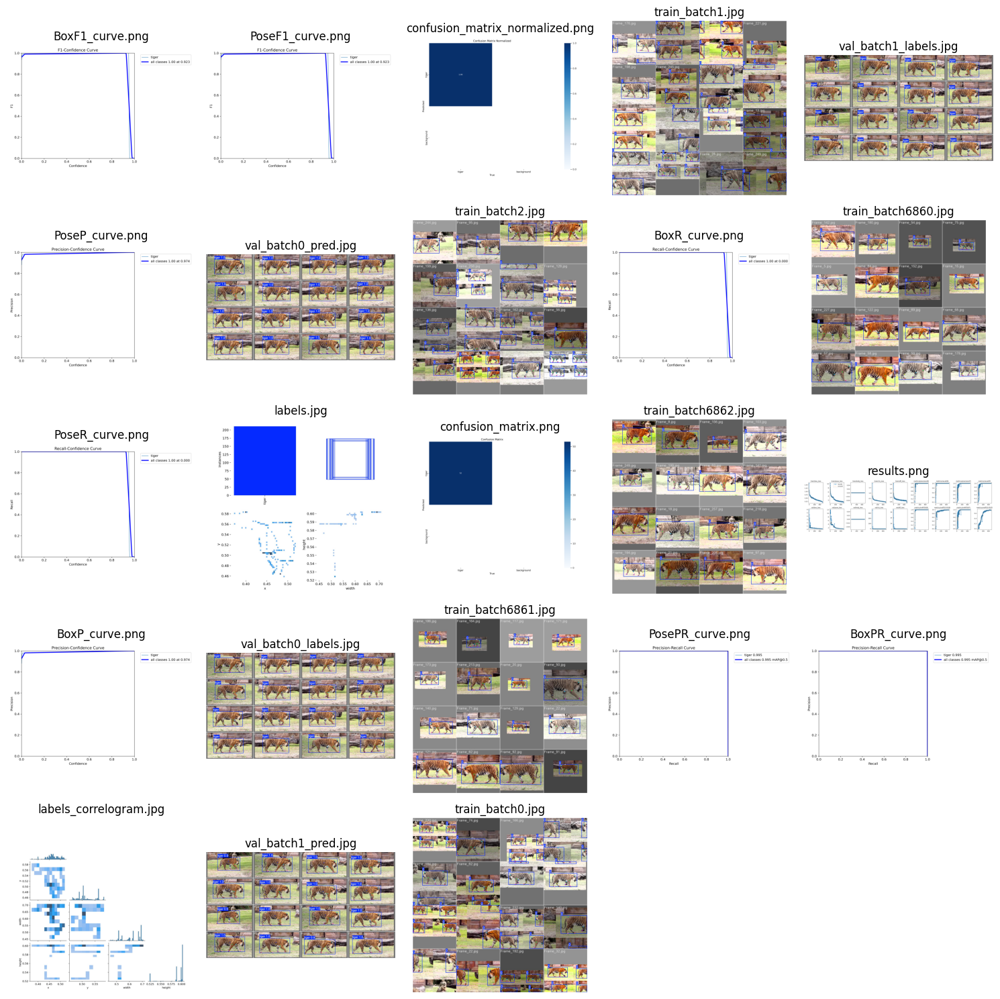

In [ ]:
def display_images_from_folder(folder_path):
    """
    Finds and displays all .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List to store images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Plotting images
    plt.figure(figsize=(15, 15))
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(5, 5, i+1)  # Adjust the grid size (5, 5) as needed
        plt.imshow(image_rgb)
        plt.title(image_file)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
display_images_from_folder("/kaggle/working/training_backup/tiger_pose_training")

### Inferencing:


image 1/1 /kaggle/working/yolo_split/val/images/Frame_229.jpg: 288x480 1 tiger, 55.3ms
Speed: 1.6ms preprocess, 55.3ms inference, 1.9ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/working/yolo_split/val/images/Frame_9.jpg: 288x480 1 tiger, 11.7ms
Speed: 1.3ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/working/yolo_split/val/images/Frame_201.jpg: 288x480 1 tiger, 11.8ms
Speed: 1.4ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/working/yolo_split/val/images/Frame_182.jpg: 288x480 1 tiger, 11.7ms
Speed: 1.3ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/working/yolo_split/val/images/Frame_42.jpg: 288x480 1 tiger, 11.4ms
Speed: 1.3ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 480)

image 1/1 /kaggle/working/yolo_split/val/images/Frame_259.jpg: 288x480 1 tige

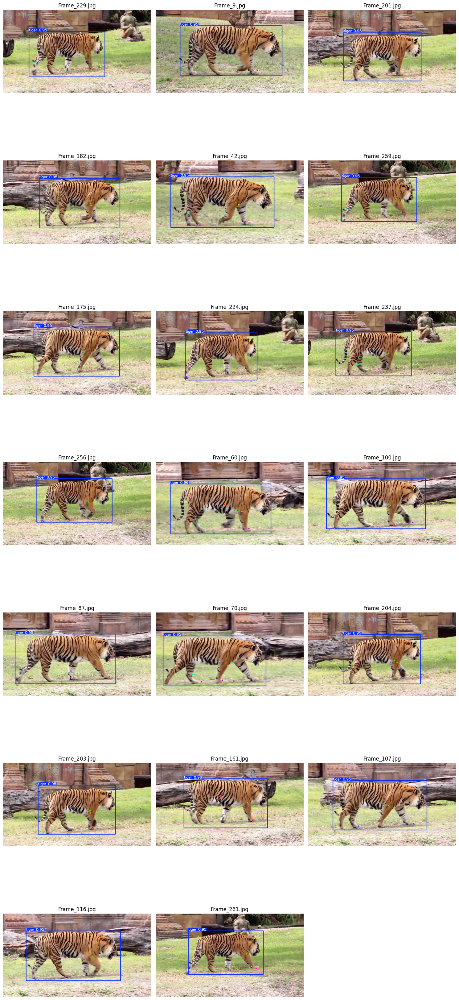

In [ ]:
def run_yolov11(image_dir, model_path, total_image=20, output_folder="/kaggle/working/result_vis"):
    # Load the YOLOv11 model
    model = YOLO(model_path)
    
    # Ensure the output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Loop through all images in the directory
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpeg', '.jpg', '.png'))]
    
    # Select the specified number of random images or all images if total_image is -1
    if total_image == -1:
        selected_files = image_files
    else:
        selected_files = random.sample(image_files, min(total_image, len(image_files)))

    result_images = []  # List to hold result images

    for image_file in selected_files:
        # Load the image
        image_path = os.path.join(image_dir, image_file)
        image = cv2.imread(image_path)

        # Run YOLOv11 segmentation prediction
        results = model.predict(image_path, conf=0.7, iou=0.7)
        
        # Get the segmented mask and draw it on the image
        result_image = results[0].plot()
        
        # Save the result image in the output folder
        output_image_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_image_path, result_image)
        
        # Append the result image to the list
        result_images.append(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB

    # Display all result images in a grid
    num_images = len(result_images)
    cols = 3  # Number of columns for the grid
    rows = (num_images + cols - 1) // cols  # Calculate the number of rows needed

    plt.figure(figsize=(15, 5 * rows))  # Adjust the figure size as needed
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(result_images[i])
        plt.axis('off')
        plt.title(selected_files[i])  # Optionally add titles

    plt.tight_layout()
    plt.show()



run_yolov11("/kaggle/working/yolo_split/val/images", model_path ="/kaggle/working/training_backup/tiger_pose_training/weights/best.pt")

### Exporting:

In [ ]:
# Export the model
model.export(format="onnx")

Ultralytics 8.3.26 🚀 Python-3.10.14 torch-2.4.0 CPU (Intel Xeon 2.00GHz)
YOLO11n-pose summary (fused): 257 layers, 2,696,611 parameters, 0 gradients, 6.7 GFLOPs

PyTorch: starting from '/kaggle/working/training_backup/tiger_pose_training/weights/best.pt' with input shape (1, 3, 480, 480) BCHW and output shape(s) (1, 29, 4725) (5.5 MB)
requirements: Ultralytics requirements ['onnxslim', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.2/226.2 MB 209.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 163.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 219.3 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 19.8s, installed 2 packages: ['onnxslim', 'onnxruntime-gpu']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: sl

'/kaggle/working/training_backup/tiger_pose_training/weights/best.onnx'